# *Práctica* limpieza de Datos

## Introducción

La página https://www.sharkattackfile.net/ lleva un control de los accidentes que se producen por
ataques de tiburones, de la misma se puede bajar el log de incidentes que tiene los siguientes datos:

| Columna   |      Desc.  |
|----------|:-------------:|
| Case #  |  ID del ataque |
| Date  | Fecha en que ocurrió el ataque   |
|Country| País en donde ocurrió el ataque|
| Area  | Provincia/Estado/Zona donde ocurrió el ataque |
|Location |Ciudad/localidad más cercana|
|Activity|Actividad que estaba haciendo la víctima|
|Name |Nombre de la víctima|
|Sex|Sexo de la víctima|
|Age| Edad de la víctima|
|Injury|Tipo de daños que sufrió la víctima|
|Time| Momento del día en que ocurrió el ataque|
|Species| Especie/s de tiburón involucrados|
|Investigator or Source| Investigador que reporto el ataque o fuente de donde se conocen los datos del ataque|

Aclaraciones
Todos los individuos sobrevivieron a menos que esté aclarado que el ataque fue fatal en el campo

Injury.
Código de colores (los colores indican el tipo de incidente)
- Unprovoked Incidents = Tan
- Provoked Incidents = Orange
- Attacks on Boats = Green
- Air / Sea Disasters = Yellow
- Questionable Incidents = Blue

Otra información

- Unprovoked vs. Provoked - GSAF defines a provoked incident as one in which the shark was
speared, hooked, captured or in which a human drew "first blood". Although such incidents are of
little interest to shark behaviorists, when the species of shark involved is known and pre-op photos of
the wounds are available, the bite patterns are of value in determining species of shark involved in
other cases when the species could not identified by the patient or witnesses. We know that a live
human is rarely perceived as prey by a shark. Many incidents are motivated by curiosity, others may
result when a shark perceives a human as a threat or competitor for a food source, and could be
classed as "provoked" when examined from the shark's perspective.

- Attacks on Boats – Incidents in which a boat was bitten or rammed by a shark are in green.

However, in cases in which the shark was hooked, netted or gaffed, the entry is orange because they
are classed as provoked incidents.

- Casualties of War & Air/Sea Disasters - Sharks maintain the health of the marine ecosystem by
removing the dead or injured animals. Many incidents result because, like other animals that don't rely
on instinct alone, sharks explore their environment. Lacking hands, they may investigate an
unfamiliar object with their mouths. Unlike humans, there is no malice in sharks; they simply do what
nature designed them to do.

- Air/Sea Disasters are accidents that place people into the day-to-day
business of sharks. The wartime losses due to sharks result from mans' cruelty to man. Air/Sea Disasters are in yellow.

- Questionable incidents - Incidents in which there are insufficient data to determine if the injury was
caused by a shark or the person drowned and the body was later scavenged by sharks. In a few cases,
despite media reports to the contrary, evidence indicated there was no shark involvement whatsoever.
Such incidents are in blue.

---


A partir de la información provista se necesita conocer:

a) La cantidad de incidentes de cada tipo

b) La cantidad de incidentes de cada tipo por país

Es necesario entregar la base que se utilizó para efectuar los cálculos.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import collections
import seaborn as sns
import matplotlib.ticker as mtick

In [ ]:
FILE_DS_NAME = 'https://github.com/carlossanchezarg/tiburones_atack/raw/main/notebook/GSAF5.xlsx'

In [ ]:
xl = pd.ExcelFile(FILE_DS_NAME)

In [ ]:
xl.sheet_names

['Sheet1-GSAF']

In [ ]:
df = xl.parse("Sheet1-GSAF")

In [ ]:
df.columns

Index(['Date', 'Year', 'Type', 'Country', 'State', 'Location', 'Activity',
       'Name', 'Sex', 'Age', 'Injury', 'Unnamed: 11', 'Time', 'Species ',
       'Source', 'pdf', 'href formula', 'href', 'Case Number', 'Case Number.1',
       'original order', 'Unnamed: 21', 'Unnamed: 22'],
      dtype='object')

Quitemos las columnas que no tienen datos que nos interesen para los problemas a resolver:
 - Sex , Age, Case number, Case Number.1, original order, Unnamed: 21, Unnamed: 22, href formula, href, Unnamed: 11, Time, Species, Name, Source, Activity, pdf

In [ ]:
columns_to_drop = ["Activity","Name","Sex","Age", "Unnamed: 11", "Time","Species ",
                   "Source", "pdf" ,"href formula","href", "Case Number",
                   "Case Number.1","original order", "Unnamed: 21","Unnamed: 22"
                   ]
df = df.drop(columns = columns_to_drop)
df

,Date,Year,Type,Country,State,Location,Injury
0,10 Nov-2023,2023.0,Unprovoked,AUSTRALIA,South Australia,Port Noarlunga,Injuries to scalp and face
1,03 Nov-2023,2023.0,Unprovoked,AUSTRALIA,Westerm Australia,Peak Island,Minor injury
2,02 Nov-2023,2023.0,Unprovoked,NEW ZEALAND,North Island,Cape Pallister,Minor injury. Wetsuit shredded
3,31 Oct-2023,2023.0,Unprovoked,AUSTRALIA,South Australia,Streaky Bay,FATAL
4,25 Oct 2023,2023.0,Unprovoked,USA,Hawaii,"Pua’ena Point, Haleiwa, Oahu",Bite to right thigh
...,...,...,...,...,...,...,...
6934,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6935,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6936,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6937,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Veamos cuantos celdas sin datos tenemos:

In [ ]:
df.isnull().sum()

Date         25
Year         27
Type         43
Country      75
State       506
Location    589
Injury       60
dtype: int64

Ahora revisemos que columnas tienen datos desconocidos en la columna "Type".

In [ ]:
print(f'Hay {df[df["Type"].isnull()].shape[0]} filas con la propiedad Type vacia')
df[df['Type'].isnull()]

Hay 43 filas con la propiedad Type vacia


,Date,Year,Type,Country,State,Location,Injury
163,01-Apr-2022,2022.0,NaN,SOUTH AFRICA,KZN,LaLucia,Possible drowing and scavenging
179,08-Feb-2022,2022.0,NaN,COSTA RICA,Guanacoste,Playa Del Coco,Right forearm and left hand injured
200,16-Oct-2021,2021.0,NaN,AUSTRALIA,Queensland,Sudbury Island,Disappeared
205,10-Sep-2021,2021.0,NaN,EGYPT,NaN,Sidi Abdel Rahmen,Laceration to arm caused by metal object
226,21-Jul-2021,2021.0,NaN,USA,Florida,"Near Patrick AFB, Brevard County","Small laceration to ankle, shark involvement n..."
314,21-Oct-2020,2020.0,NaN,USA,North Carolina,"Emerald Isle, Carteret County",Laceration to knee and foot
319,21-Sep-2020,2020.0,NaN,USA,Hawaii,"Charley Young Beach, Maui",Lacerations and puncture wounds to shoulder
323,16-Sep-2020,2020.0,NaN,USA,Florida,"Daytona Beach Shores, Volusia County",Minor cuts and punctures to left foot
326,08-Sep-2020,2020.0,NaN,USA,Florida,Canaveral National Seashore,Hand bitten that was holding a fish PROVOKED I...
336,19-Aug-2020,2020.0,NaN,USA,South Carolina,"Myrtle Beach, Horry County",Minor injury to arm by a fish


Como se vio anteriormente a partir de la fila 6911 no tenemos datos, por lo tanto quitemos las filas a partir de la 6911 ya que no tienen datos relevantes.

In [ ]:
df = df.drop(index = range(6911,len(df)))
df

,Date,Year,Type,Country,State,Location,Injury
0,10 Nov-2023,2023.0,Unprovoked,AUSTRALIA,South Australia,Port Noarlunga,Injuries to scalp and face
1,03 Nov-2023,2023.0,Unprovoked,AUSTRALIA,Westerm Australia,Peak Island,Minor injury
2,02 Nov-2023,2023.0,Unprovoked,NEW ZEALAND,North Island,Cape Pallister,Minor injury. Wetsuit shredded
3,31 Oct-2023,2023.0,Unprovoked,AUSTRALIA,South Australia,Streaky Bay,FATAL
4,25 Oct 2023,2023.0,Unprovoked,USA,Hawaii,"Pua’ena Point, Haleiwa, Oahu",Bite to right thigh
...,...,...,...,...,...,...,...
6906,Before 1906,0.0,Unprovoked,AUSTRALIA,NaN,NaN,FATAL
6907,Before 1906,0.0,Unprovoked,AUSTRALIA,NaN,NaN,FATAL
6908,Before 1906,0.0,Unprovoked,AUSTRALIA,New South Wales,,FATAL
6909,Before 1903,0.0,Unprovoked,AUSTRALIA,Western Australia,Roebuck Bay,FATAL


# Punto 1

Utilicemos la libreria openpyxl para dar valor a los colores que tiene la tabla, ya que muchos de los valores nulos en "type" tienen color, que como dice en la explicacion de la tabla tiene significado.

In [ ]:
from io import BytesIO
import urllib
import openpyxl
archivo_xlsx = urllib.request.urlopen(FILE_DS_NAME).read()
wb = openpyxl.load_workbook(BytesIO(archivo_xlsx),data_only=True)

In [ ]:
fs = wb.active
fs_count_row = 6912
fs_count_col = 1
colors = []
colors_name = []
for row in range(2,fs_count_row+1):
    for column in range(1,fs_count_col+1):
        cell_color = fs.cell(column=column, row=row)
        fgColor = cell_color.fill.fgColor.index
        if (fgColor=='00000000'):
            continue
        else:
          colors.append(fgColor)

In [ ]:
color_count = collections.Counter(colors)
print(color_count)

Counter({47: 5091, 8: 610, 44: 582, 42: 362, 43: 244, 53: 22})


Traduzcamos los codigos de colores a strings:

In [ ]:
colors_name = []
for color in colors:
  if(color == 47):
    colors_name.append("tan")
  elif(color == 8):
    colors_name.append("orange")
  elif(color == 44):
    colors_name.append("blue")
  elif(color == 42):
    colors_name.append("green")
  elif(color == 43):
    colors_name.append("yellow")
  elif(color == 53):
    colors_name.append("orange")
print(colors_name)

['tan', 'tan', 'tan', 'tan', 'tan', 'orange', 'green', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'green', 'tan', 'tan', 'tan', 'tan', 'green', 'blue', 'tan', 'orange', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'green', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'blue', 'tan', 'orange', 'tan', 'tan', 'tan', 'tan', 'orange', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'green', 'tan', 'tan', 'tan', 'tan', 'blue', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'blue', 'blue', 'tan', 'tan', 'tan', 'tan', 'tan', 'orange', 'orange', 'orange', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'orange', 'tan', 'yellow', 'tan', 'orange', 'tan', 'tan', 'orange', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'blue', 'tan', 'orange', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 'tan', 't

Ahora agreguemos los datos sobre colores encontrados al dataframe:

In [ ]:
colors_series = pd.Series(colors,name ="color")

if("color" not in df.columns):
   df = pd.concat([df,colors_series], axis = 1)

Podemos definir una correspondencias entre los codigos de color y el tipo de incidente, asociando los términos de similar significado:

**Tabla 1**

| Código de color   |       Tipo  |
|----------|:-------------:|
|tan: Unprovoked | Unprovoked  |
| orange:Provoked  | Provoked |
| green:Attacks on Boats  |  Sea Disaster,Watercraft,Boat  |
| yellow:Air/Sea Disasters  |  Sea Disaster,Watercraft,Boat  |
| blue:Questionable |  Questionable,Invalid,Unconfirmed,Under investigation,Unverified, "?"  |




In [ ]:
color_code = { 'tan': 'Unprovoked',
               'orange':'Provoked',
               'green':'Attacks on Boats',
               'yellow':'Air/Sea Disasters',
               'blue':'Questionable'
              }

color_code_with_type_mapping = {
    'Unprovoked':['Unprovoked'],
    'Provoked':['Provoked'],
    'Attacks on Boats': ['Sea Disaster','Watercraft','Boat'],
    'Air/Sea Disasters':['Sea Disaster','Watercraft','Boat'],
    'Questionable':['Questionable','Invalid','Unconfirmed','Under investigation','Unverified','?'],
    '?':['Questionable','Invalid','Unconfirmed','Under investigation','Unverified','?']
}
colors_name_series = pd.Series(colors_name, name = "color_name")
type_by_color = colors_name.copy()
type_by_color =list(map(lambda color: color_code[color], type_by_color))

if("color_name" not in df.columns):
  df = pd.concat([df,colors_name_series], axis = 1)

color_code_as_type = pd.Series(type_by_color, name="color_code_as_type")
if("color_code_as_type" not in df.columns):
  df = pd.concat([df, color_code_as_type], axis = 1)

In [ ]:
colors_name_count = collections.Counter(colors_name)
print(colors_name_count)

Counter({'tan': 5091, 'orange': 632, 'blue': 582, 'green': 362, 'yellow': 244})


Veamos como nos quedo el dataframe agregando el código de color y su significado (color_code_as_type)

In [ ]:
df

,Date,Year,Type,Country,State,Location,Injury,color,color_name,color_code_as_type
0,10 Nov-2023,2023.0,Unprovoked,AUSTRALIA,South Australia,Port Noarlunga,Injuries to scalp and face,47,tan,Unprovoked
1,03 Nov-2023,2023.0,Unprovoked,AUSTRALIA,Westerm Australia,Peak Island,Minor injury,47,tan,Unprovoked
2,02 Nov-2023,2023.0,Unprovoked,NEW ZEALAND,North Island,Cape Pallister,Minor injury. Wetsuit shredded,47,tan,Unprovoked
3,31 Oct-2023,2023.0,Unprovoked,AUSTRALIA,South Australia,Streaky Bay,FATAL,47,tan,Unprovoked
4,25 Oct 2023,2023.0,Unprovoked,USA,Hawaii,"Pua’ena Point, Haleiwa, Oahu",Bite to right thigh,47,tan,Unprovoked
...,...,...,...,...,...,...,...,...,...,...
6906,Before 1906,0.0,Unprovoked,AUSTRALIA,NaN,NaN,FATAL,47,tan,Unprovoked
6907,Before 1906,0.0,Unprovoked,AUSTRALIA,NaN,NaN,FATAL,47,tan,Unprovoked
6908,Before 1906,0.0,Unprovoked,AUSTRALIA,New South Wales,,FATAL,47,tan,Unprovoked
6909,Before 1903,0.0,Unprovoked,AUSTRALIA,Western Australia,Roebuck Bay,FATAL,47,tan,Unprovoked


In [ ]:
df.groupby("Type").size().sort_values()

Type
?                         1
Unconfirmed               1
Under investigation       1
Unverified                1
Boat                      7
Questionable             19
Sea Disaster            242
Watercraft              355
Invalid                 552
Provoked                633
Unprovoked             5081
dtype: int64

Ahora veamos si el Type de los datos respeta el código de colores:



In [ ]:
unique_pairs = df.groupby(['Type', 'color_code_as_type']).size().reset_index(name='count')
print(unique_pairs.sort_values('count', ascending=False))

                   Type color_code_as_type  count
17           Unprovoked         Unprovoked   5072
4              Provoked           Provoked    629
2               Invalid       Questionable    548
20           Watercraft   Attacks on Boats    353
8          Sea Disaster  Air/Sea Disasters    239
6          Questionable       Questionable     17
1                  Boat   Attacks on Boats      7
3               Invalid         Unprovoked      4
5              Provoked         Unprovoked      4
13           Unprovoked  Air/Sea Disasters      3
16           Unprovoked       Questionable      3
10         Sea Disaster       Questionable      2
7          Questionable         Unprovoked      2
15           Unprovoked           Provoked      2
19           Watercraft  Air/Sea Disasters      1
18           Unverified       Questionable      1
0                     ?         Unprovoked      1
11          Unconfirmed       Questionable      1
14           Unprovoked   Attacks on Boats      1


## Consistencia enre el código de color y la columna "Type"
Se puede ver que hay varios pares que no corresponden con las relaciones esperadas en el cuadro anterior. En base a las relaciones definidas en el cuadro anterior, podemos ver cuales no son consistentes:




In [ ]:
print(f'Col. "Type"                Tipo según color              Cantidad')
print(f'_____________________________________________________________')
total=0
for index, row in unique_pairs.iterrows():
  if not row.Type in color_code_with_type_mapping[row.color_code_as_type]:
    cant=row['count']
    print(f'{row.Type:<20}        {row.color_code_as_type:<20}          {cant:<5}')
    total+=cant
print(f'_____________________________________________________________')
print(f'Total de relaciones inconsistentes entre el código de color y su tipo: {total}')


Col. "Type"                Tipo según color              Cantidad
_____________________________________________________________
?                           Unprovoked                    1    
Invalid                     Unprovoked                    4    
Provoked                    Unprovoked                    4    
Questionable                Unprovoked                    2    
Sea Disaster                Questionable                  2    
Under investigation         Unprovoked                    1    
Unprovoked                  Air/Sea Disasters             3    
Unprovoked                  Attacks on Boats              1    
Unprovoked                  Provoked                      2    
Unprovoked                  Questionable                  3    
Watercraft                  Unprovoked                    1    
_____________________________________________________________
Total de relaciones inconsistentes entre el código de color y su tipo: 24


Por ejemplo:

In [ ]:
df.loc[(df["Type"] == "?") & (df["color_name"] == "tan")]

,Date,Year,Type,Country,State,Location,Injury,color,color_name,color_code_as_type
173,21-Feb-2022,2022.0,?,BAHAMAS,Grand Bahama Island,Tiger Beach,Arm bitten,47,tan,Unprovoked


In [ ]:
df.loc[(df["Type"] == "Provoked") & (df["color_name"] == "tan")]

,Date,Year,Type,Country,State,Location,Injury,color,color_name,color_code_as_type
221,27-Jul-2021,2021.0,Provoked,AUSTRALIA,Western Australia,Varanus Island,Leg bitten when he jumped on the sharkPROVOKED...,47,tan,Unprovoked
637,21-Dec-2017,2017.0,Provoked,MALAYSIA,Sepang,Bagan Lalang Beach,"Minor injury to thigh, PROVOKED INCIDENT",47,tan,Unprovoked
4998,04-Aug-1952,1952.0,Provoked,ITALY,Genoa Province,Riva Trigoso,Bitten by hooked shark PR...,47,tan,Unprovoked
6559,Reported 09-Jul-1863,1863.0,Provoked,USA,Hawaii,Palama,Hand severed by noosed shark PROVOKED INCIDENT,47,tan,Unprovoked


Despues de analizar varios casos particulares, decidimos que es mejor tener en cuenta los colores como tipos para los incidentes, ya que la columna "type" tiene varios faltantes además de datos que no son consistentes con los articulos que acompañan a cada incidente.

Grafiquemos la cantidad de Incidentes por color que tenemos.

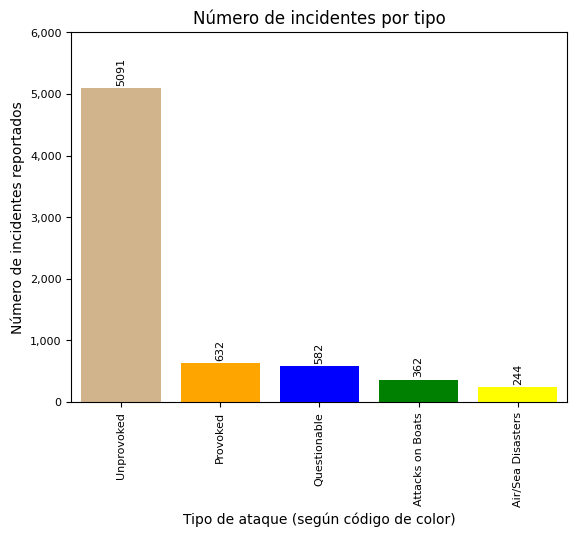

In [ ]:
df_counts = df["color_code_as_type"].value_counts()

colors = ['tan', 'orange', 'blue', 'green', 'yellow']

ax = df_counts.plot.bar(stacked=False,fontsize = 8, )


ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

# set the title and axis labels
ax.set_title('Número de incidentes por tipo')
ax.set_ylabel('Número de incidentes reportados')
ax.set_xlabel('Tipo de ataque (según código de color)')
ax.bar_label(ax.bar(df_counts.index,df_counts.values,color=colors), fmt='%.0f', rotation='vertical',padding=2, fontsize=8)
ax.yaxis.set_ticks(range(0,7000,1000))

plt.show()

# Punto 2

Primero veamos cuantos elementos tenemos con la propiedad Country vacia:

In [ ]:
null_countries = df.Country.isnull().sum()
print(f"Hay {null_countries} filas sin dato de pais")

Hay 50 filas sin dato de pais


Completemos los datos faltantes con "deconocido" asi los podemos analizar:

In [ ]:
df['Country'] = df['Country'].fillna('Unknown')

Ahora veamos cuantos paises unicos tenemos:

In [ ]:
df.Country.nunique()

224

Claramente son demasiados paises, por lo tanto debe haber problemas con algunos de los nombres. Veamos que nombres aparecen:

In [ ]:
unique_countries = df.Country.unique()
print(unique_countries)

['AUSTRALIA' 'NEW ZEALAND' 'USA' 'Mexico' 'BELIZE' 'EGYPT' 'PHILIPPINES'
 'Coral Sea' 'BAHAMAS' 'SPAIN' 'PORTUGAL' 'COLOMBIA' 'SOUTH AFRICA'
 'ECUADOR' 'FRENCH POLYNESIA' 'NEW CALEDONIA' 'TURKS and CaICOS' 'MEXICO'
 'BRAZIL' 'SEYCHELLES' 'ARGENTINA' 'FIJI' 'MeXICO' 'Maldives'
 'South Africa' 'ENGLAND' 'JAPAN' 'INDONESIA' 'JAMAICA' 'MALDIVES'
 'THAILAND' 'COLUMBIA' 'COSTA RICA' 'New Zealand'
 'British Overseas Territory' 'CANADA' 'JORDAN' 'ST KITTS / NEVIS'
 'ST MARTIN' 'PAPUA NEW GUINEA' 'REUNION ISLAND' 'ISRAEL' 'CHINA' 'SAMOA'
 'IRELAND' 'ITALY' 'MALAYSIA' 'LIBYA' 'Unknown' 'CUBA' 'MAURITIUS'
 'SOLOMON ISLANDS' 'ST HELENA, British overseas territory' 'COMOROS'
 'REUNION' 'UNITED KINGDOM' 'UNITED ARAB EMIRATES' 'CAPE VERDE' 'Fiji'
 'DOMINICAN REPUBLIC' 'CAYMAN ISLANDS' 'ARUBA' 'MOZAMBIQUE' 'PUERTO RICO'
 'ATLANTIC OCEAN' 'GREECE' 'ST. MARTIN' 'FRANCE' 'TRINIDAD & TOBAGO'
 'KIRIBATI' 'DIEGO GARCIA' 'TAIWAN' 'PALESTINIAN TERRITORIES' 'GUAM'
 'NIGERIA' 'TONGA' 'SCOTLAND' 'CROATIA' 'SAUDI

Ordenemoslos para que sea mas facil ver nombres repetidos y errores:

In [ ]:
unique_countries_str = [str(x) for x in unique_countries]
sorted(unique_countries_str)

[' PHILIPPINES',
 ' TONGA',
 'ADMIRALTY ISLANDS',
 'AFRICA',
 'ALGERIA',
 'AMERICAN SAMOA',
 'ANDAMAN / NICOBAR ISLANDAS',
 'ANDAMAN ISLANDS',
 'ANGOLA',
 'ANTIGUA',
 'ARGENTINA',
 'ARUBA',
 'ASIA?',
 'ATLANTIC OCEAN',
 'AUSTRALIA',
 'AZORES',
 'BAHAMAS',
 'BAHREIN',
 'BANGLADESH',
 'BARBADOS',
 'BAY OF BENGAL',
 'BELIZE',
 'BERMUDA',
 'BRAZIL',
 'BRITISH ISLES',
 'BRITISH NEW GUINEA',
 'BRITISH VIRGIN ISLANDS',
 'BRITISH WEST INDIES',
 'BURMA',
 'Between PORTUGAL & INDIA',
 'British Overseas Territory',
 'CANADA',
 'CAPE VERDE',
 'CARIBBEAN SEA',
 'CAYMAN ISLANDS',
 'CENTRAL PACIFIC',
 'CEYLON',
 'CHILE',
 'CHINA',
 'COLOMBIA',
 'COLUMBIA',
 'COMOROS',
 'COOK ISLANDS',
 'COSTA RICA',
 'CRETE',
 'CROATIA',
 'CUBA',
 'CURACAO',
 'CYPRUS',
 'Coast of AFRICA',
 'Coral Sea',
 'DIEGO GARCIA',
 'DJIBOUTI',
 'DOMINICAN REPUBLIC',
 'ECUADOR',
 'EGYPT',
 'EGYPT ',
 'EGYPT / ISRAEL',
 'EL SALVADOR',
 'ENGLAND',
 'EQUATORIAL GUINEA / CAMEROON',
 'FALKLAND ISLANDS',
 'FEDERATED STATES OF MICRONESI

Se pueden ver que hay varios nombres que en lo unico que varian es que mezclan minusculas y mayusculas o tienen espacios donde no deberian. Limpiemos la columna de estos defectos:

In [ ]:
df['Country'] = df['Country'].str.upper()
df['Country'] = df['Country'].map(lambda p : p.strip())

Veamos cuantos nombres unicos tenemos ahora:

In [ ]:
print(df.Country.nunique())

unique_countries = df.Country.unique()
# print(sorted(unique_countries))

208


A pesar de que disminuyo la cantidad siguen siendo muchos, veamos casos particulares y sigamos disminuyendo la cantidad de nombres:

In [ ]:
df.Country.value_counts().to_frame()

,Country
USA,2533
AUSTRALIA,1472
SOUTH AFRICA,597
NEW ZEALAND,144
PAPUA NEW GUINEA,136
...,...
TURKS AND CAICOS,1
BRITISH WEST INDIES,1
ADMIRALTY ISLANDS,1
FEDERATED STATES OF MICRONESIA,1


Se pueden ver facilmente que varios paises tienen mal escritos sus nombres, por ejemplo colombia que aparece como colombia y columbia o ceylon que aparece de varias formas diferentes. Juntemos todos estos nombres con el que corresponda:

In [ ]:
# Cambiamos columbia por colombia
df.loc[df['Country'] == 'COLUMBIA',['Country']] = 'COLOMBIA'

In [ ]:
# CEYLON
df.loc[df['Country'] == 'CEYLON (SRI LANKA)',['Country']] = 'CEYLON'
df.loc[df['Country'] == 'SRI LANKA',['Country']] = 'CEYLON'

In [ ]:
# UNITED ARAB EMIRATES (UAE) a UNITED ARAB EMIRATES
df.loc[df['Country'] == 'UNITED ARAB EMIRATES (UAE)',['Country']] = 'UNITED ARAB EMIRATES'

In [ ]:
#TOBAGO a TRINIDAD Y TOBAGO
df.loc[df['Country'] == 'TOBAGO',['Country']] = 'TRINIDAD & TOBAGO'

In [ ]:
#NEVIS y ST KITTS / NEVIS A SAINT KITTS AND NEVIS
df.loc[df['Country'] == 'NEVIS',['Country']] = 'SAINT KITTS AND NEVIS'
df.loc[df['Country'] == 'ST KITTS / NEVIS',['Country']] = 'SAINT KITTS AND NEVIS'

In [ ]:
#GRAND CAYMAN a CAYMAN ISLANDS
df.loc[df['Country'] == 'GRAND CAYMAN',['Country']] = 'CAYMAN ISLANDS'

In [ ]:
#NEW BRITAIN y ADMITALTY ISLANDS a PAPUA NEW GUINEA
df.loc[df['Country'] == 'NEW BRITAIN',['Country']] = 'PAPUA NEW GUINEA'
df.loc[df['Country'] == 'ADMIRALTY ISLANDS',['Country']] = 'PAPUA NEW GUINEA'

In [ ]:
#ANTIGUA a ANTIGUA AND BARBUDA
df.loc[df['Country'] == 'ANTIGUA',['Country']] = 'ANTIGUA AND BARBUDA'

In [ ]:
#AZORES a PORTUGAL
df.loc[df['Country'] == 'AZORES',['Country']] = 'PORTUGAL'

In [ ]:
#BRITISH ISLES a UNITED KINGDOM
df.loc[df['Country'] == 'BRITISH ISLES',['Country']] = 'UNITED KINGDOM'

In [ ]:
#OKINAWA A JAPON
df.loc[df['Country'] == 'OKINAWA',['Country']] = 'JAPAN'

In [ ]:
#CRETE A GREECE
df.loc[df['Country'] == 'CRETE',['Country']] = 'GREECE'

In [ ]:
#westerm samoa a samoa
df.loc[df['Country'] == 'WESTERN SAMOA',['Country']] = 'SAMOA'

In [ ]:
#ST. MAARTIN y ST MARTIN a ST. MARTIN
df.loc[df['Country'] == 'ST. MAARTIN',['Country']] = 'ST. MARTIN'
df.loc[df['Country'] == 'ST MARTIN',['Country']] = 'ST. MARTIN'

In [ ]:
#JAVA a INDONESIA
df.loc[df['Country'] == 'JAVA',['Country']] = 'INDONESIA'

In [ ]:
#KOREA to SOUTH KOREA
df.loc[df['Country'] == 'KOREA',['Country']] = 'SOUTH KOREA'

In [ ]:
#MALDIVE ISLANDS a MALDIVES
df.loc[df['Country'] == 'MALDIVE ISLANDS',['Country']] = 'MALDIVES'

In [ ]:
#ROATAN A HONDURAS
df.loc[df['Country'] == 'ROATAN',['Country']] = 'HONDURAS'

In [ ]:
#THE BALKANS a SLOVENIA
df.loc[df['Country'] == 'THE BALKANS',['Country']] = 'SLOVENIA'

In [ ]:
# EQUATORIAL GUINEA / CAMEROON to EQUATORIAL GUINEA
df.loc[df['Country'] == 'EQUATORIAL GUINEA / CAMEROON',['Country']] = 'EQUATORIAL GUINEA'

In [ ]:
# andaman islands y nicobar islands y NICOBAR ISLANDAS a INDIA,
df.loc[df['Country'] == 'ANDAMAN / NICOBAR ISLANDAS',['Country']] = 'INDIA'
df.loc[df['Country'] == 'ANDAMAN ISLANDS',['Country']] = 'INDIA'

In [ ]:
# TURKS and CaICOS, BRITISH OVERSEAS TERRITORY y BRITISH WEST INDIES a TURKS AND CAICOS ISLANDS
df.loc[df['Country'] == 'TURKS and CaICOS',['Country']] = 'TURKS AND CAICOS ISLANDS'
df.loc[df['Country'] == 'BRITISH OVERSEAS TERRITORY',['Country']] = 'TURKS AND CAICOS ISLANDS'
df.loc[df['Country'] == 'BRITISH WEST INDIES',['Country']] = 'TURKS AND CAICOS ISLANDS'
df.loc[df['Country'] == 'TURKS & CAICOS',['Country']] = 'TURKS AND CAICOS ISLANDS'

In [ ]:
#FALKLAND ISLANDS A ARGENTINA
df.loc[df['Country'] == 'FALKLAND ISLANDS',['Country']] = 'ARGENTINA'

Revisando la cantidad de países nuevamente:

In [ ]:
print(df.Country.nunique())

183


In [ ]:
df.groupby("Country").size().sort_values()

Country
AFRICA                 1
GUATEMALA              1
GREENLAND              1
RED SEA?               1
GHANA                  1
                    ... 
PAPUA NEW GUINEA     143
NEW ZEALAND          144
SOUTH AFRICA         597
AUSTRALIA           1472
USA                 2533
Length: 183, dtype: int64

## Casos en los que no se puedo encontrar una correspondencia univoca con un país:

- AFRICA 1
- PACIFIC OCEAN 17
- SOUTH ATLANTIC OCEAN  12
- NEW GUINEA    10
- NORTH PACIFIC OCEAN   7
- INDIAN OCEAN  7
- MID ATLANTIC OCEAN    5
- PERSIAN GULF  4
- NORTH ATLANTIC OCEAN  4
- AMERICAN SAMOA    3
- JOHNSTON ISLAND   2
- SOUTH PACIFIC OCEAN   2
- CENTRAL PACIFIC   2
- MEDITERRANEAN SEA 2
- SOUTHWEST PACIFIC OCEAN   2
- ST HELENA, British overseas territory 2
- PACIFIC OCEAN     2
- WEST INDIES   2
- SOLOMON ISLANDS / VANUATU 1
- RED SEA   1
- ITALY / CROATIA   1
- BAY OF BENGAL 1
- Coral Sea 1
- PALESTINIAN TERRITORIES   1
- DIEGO GARCIA  1
- RED SEA?  1
- Between PORTUGAL & INDIA  1
- SOUTH CHINA SEA   1
- MID-PACIFC OCEAN  1
- SUDAN?    1
- NETHERLANDS ANTILLES  1
- EGYPT / ISRAEL    1
- ASIA? 1
- RED SEA / INDIAN OCEAN    1
- NORTH ATLANTIC OCEAN  1
- SAN DOMINGO   1
- TASMAN SEA    1
- Coast of AFRICA   1
- GULF OF ADEN  1
- NORTHERN ARABIAN SEA  1
- INDIAN OCEAN? 1
- NORTHERN MARIANA ISLANDS  1
- IRAN / IRAQ   1
- OCEAN 1
- BRITISH NEW GUINEA    1
- NORTH SEA 1

Completamos datos desconocidos con "UNKNOWN" y luego modificamos a partir de otros datos de la fila en los casos posibles:

In [ ]:
df[df["Country"] == "UNKNOWN"]

,Date,Year,Type,Country,State,Location,Injury,color,color_name,color_code_as_type
644,Reported 13-Nov-2017,2017.0,Unprovoked,UNKNOWN,NaN,NaN,Puncture wounds to feet,47,tan,Unprovoked
1110,Aug-2014,2014.0,Invalid,UNKNOWN,NaN,NaN,Shark involvement prior to death not confirmed,44,blue,Questionable
3546,Ca. 1983,1983.0,Unprovoked,UNKNOWN,English Channel,NaN,Left leg bitten,47,tan,Unprovoked
3976,Nov-1970,1970.0,Unprovoked,UNKNOWN,NaN,NaN,Extensive injuries,47,tan,Unprovoked
3985,02-Aug-1970,1970.0,Invalid,UNKNOWN,Caribbean Sea,Between St. Kitts & Nevis,"Sharks scavenged on bodies, but no record of t...",44,blue,Questionable
3986,5-Jul-1970,1970.0,Unprovoked,UNKNOWN,NaN,NaN,Finger or toe severed,47,tan,Unprovoked
3993,Apr-1970,1970.0,Provoked,UNKNOWN,NaN,NaN,Arm abraded & lacerated. Recorded as PROVOKED ...,8,orange,Provoked
3997,5-Feb-1970,1970.0,Unprovoked,UNKNOWN,NaN,NaN,Lacerations to lower leg,47,tan,Unprovoked
4023,Aug-1969,1969.0,Unprovoked,UNKNOWN,NaN,NaN,Am lacerated,47,tan,Unprovoked
4203,21-Oct-1965,1965.0,Unprovoked,UNKNOWN,NaN,Florida Strait,Survived,47,tan,Unprovoked


In [ ]:
df.loc[df['State'] == 'Gulf of California',['Country']] = 'MEXICO'

In [ ]:
df.loc[df['Location'] == 'Between St. Kitts & Nevis',['Country']] = 'SAINT KITTS AND NEVIS'

In [ ]:
#Ver si despues se cambia por FRANCE
df.loc[df['Location'] == 'Île Saint-Paul',['Country']] = 'FRENCH SOUTHERN TERRITORIES'

In [ ]:
(df.groupby(['color_name', 'Country']).size().reset_index(name='Number of Accidents')).sort_values('Number of Accidents', ascending=False)

,color_name,Country,Number of Accidents
335,tan,USA,1970
190,tan,AUSTRALIA,1050
311,tan,SOUTH AFRICA,414
180,orange,USA,235
74,blue,USA,209
...,...,...,...
176,orange,TRINIDAD & TOBAGO,1
177,orange,TURKEY,1
181,orange,VANUATU,1
182,orange,VIETNAM,1


## Cantidad de incidentes de cada tipo por país

In [ ]:
result = df.pivot_table(index='Country', columns='color_code_as_type', values='Date', aggfunc='count')
result

color_code_as_type,Air/Sea Disasters,Attacks on Boats,Provoked,Questionable,Unprovoked
Country,,,,,
AFRICA,NaN,NaN,NaN,NaN,1.0
ALGERIA,NaN,NaN,NaN,NaN,1.0
AMERICAN SAMOA,NaN,NaN,NaN,NaN,3.0
ANGOLA,NaN,NaN,NaN,NaN,1.0
ANTIGUA AND BARBUDA,1.0,NaN,NaN,1.0,NaN
...,...,...,...,...,...
VANUATU,NaN,1.0,1.0,NaN,12.0
VENEZUELA,NaN,NaN,NaN,NaN,11.0
VIETNAM,2.0,NaN,1.0,NaN,12.0


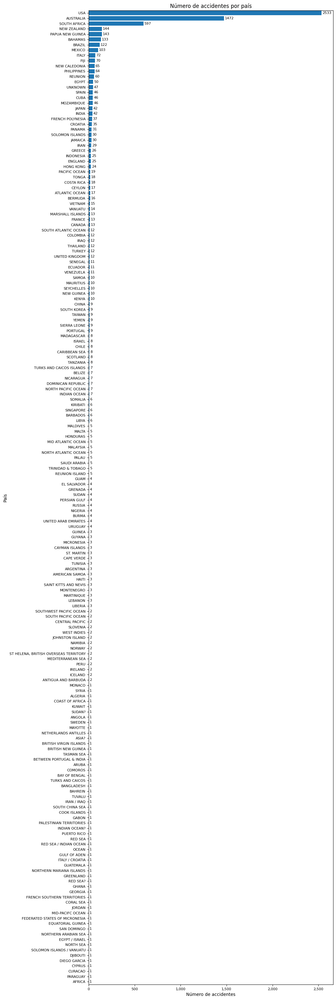

In [ ]:
pivot_df = df.pivot_table(index='Country', columns='color_code_as_type', values='Date', aggfunc='count')
pivot_df = pivot_df.sum(axis=1).sort_values(ascending=True)

# create a stacked horizontal plot
ax = pivot_df.plot.barh(stacked=False,figsize = (10,40),fontsize = 8)

ax.xaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))


# set the title and axis labels
ax.set_title('Número de accidentes por país')
ax.set_xlabel('Número de accidentes')
ax.set_ylabel('País')

ax.bar_label(ax.barh(pivot_df.index,pivot_df.values), fmt='%.0f', rotation='horizontal',padding=2, fontsize=8)


# show the plot
plt.show()

Para poder visualizar mejor vamos a dividir el grafico en tres, dependiendo la cantidad de accidentes:

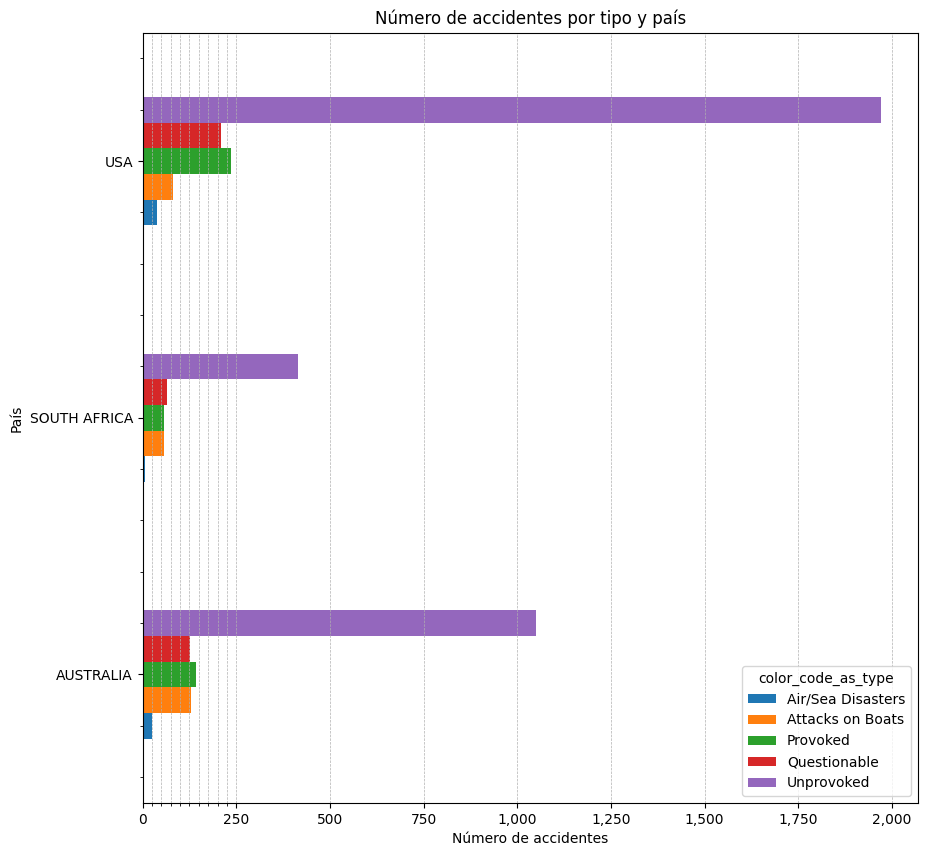

In [ ]:
# List of countries you want to filter
countries_to_filter = ['SOUTH AFRICA', 'USA', 'AUSTRALIA']

# Filter the table for rows where the country is in the list of countries to filter
filtered_df = df[df['Country'].isin(countries_to_filter)]

pivot_df = filtered_df.pivot_table(index='Country', columns='color_code_as_type', values='Date', aggfunc='count')

# create a stacked horizontal plot
ax = pivot_df.plot.barh(stacked=False,figsize = (10,10),fontsize = 10)

ax.xaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

# set the title and axis labels
ax.set_title('Número de accidentes por tipo y país')
ax.set_xlabel('Número de accidentes')
ax.set_ylabel('País')

plt.minorticks_on()

ax.set_xticks(range(0, 250, 25), minor=True)

plt.grid(which='both', axis='x', linestyle='--', linewidth=0.5)


# show the plot
plt.show()



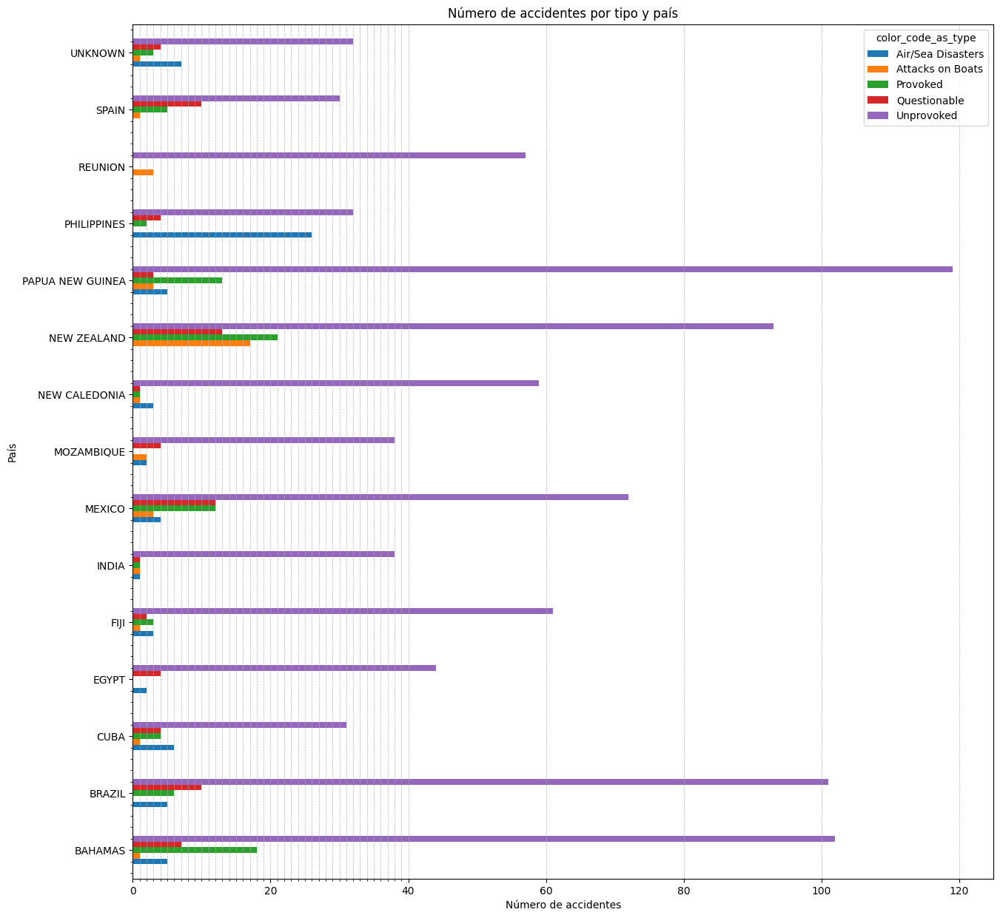

In [ ]:
# List of countries you want to filter
countries_to_filter_2 = ['NEW ZEALAND','PAPUA NEW GUINEA','BAHAMAS' ,'REUNION','PHILIPPINES',
                         'FIJI','NEW CALEDONIA', 'MEXICO','BRAZIL','EGYPT','INDIA', 'MOZAMBIQUE','UNKNOWN', 'CUBA','SPAIN']

# Filter the table for rows where the country is in the list of countries to filter
filtered_df = df[~df['Country'].isin(countries_to_filter)]
filtered_df = filtered_df[filtered_df['Country'].isin(countries_to_filter_2)]

pivot_df = filtered_df.pivot_table(index='Country', columns='color_code_as_type', values='Date', aggfunc='count')

# create a stacked horizontal plot
ax = pivot_df.plot.barh(stacked=False,figsize = (15,15),fontsize = 10)

# set the title and axis labels
ax.set_title('Número de accidentes por tipo y país')
ax.set_xlabel('Número de accidentes')
ax.set_ylabel('País')

plt.minorticks_on()

ax.set_xticks(range(1, 41), minor=True)

plt.grid(which='both', axis='x', linestyle='--', linewidth=0.5)

# show the plot
plt.show()

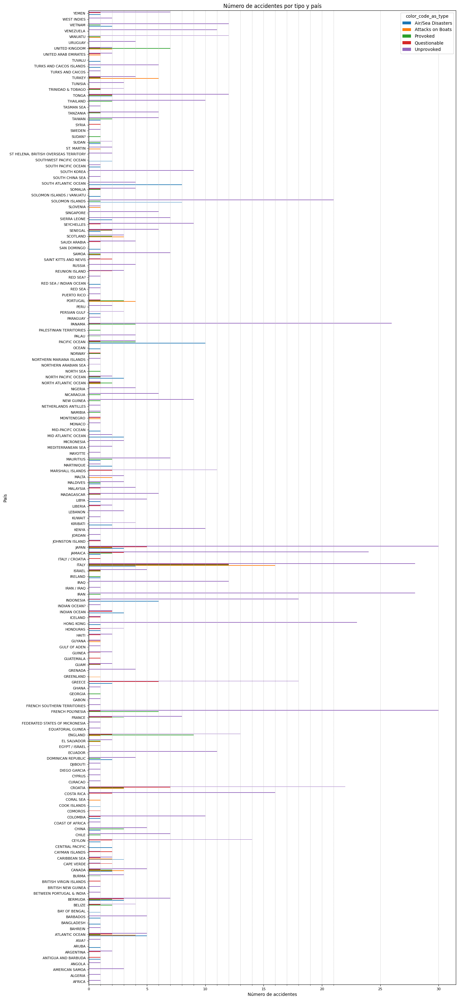

In [ ]:
# Filter the table for rows where the country is in the list of countries to filter
filtered_df = df[~df['Country'].isin(countries_to_filter)]
filtered_df = filtered_df[~filtered_df['Country'].isin(countries_to_filter_2)]

pivot_df = filtered_df.pivot_table(index='Country', columns='color_code_as_type', values='Date', aggfunc='count')

# create a stacked horizontal plot
ax = pivot_df.plot.barh(stacked=False,figsize = (15,40),fontsize = 8)

# set the title and axis labels
ax.set_title('Número de accidentes por tipo y país')
ax.set_xlabel('Número de accidentes')
ax.set_ylabel('País')

plt.minorticks_on()

ax.set_xticks(range(1, 22), minor=True)

plt.grid(which='both', axis='x', linestyle='--', linewidth=0.5)

# show the plot
plt.show()

## Mapa: distribución geografica de los ataques por país



* Podemos asociar a cada ataque coordenadas según el país donde ocurrieron y representarlos en un mapa para observar su distribución geográfica.




* Primero mapeamos cada país a un conjunto de coordenadas de latitud y longitud para poder luego graficarlos en el mapa.

In [ ]:
import numpy as np

# Ref. https://developers.google.com/public-data/docs/canonical/countries_csv
paises_df = pd.read_csv('https://raw.githubusercontent.com/carlossanchezarg/tiburones_atack/main/notebook/paises.csv')

def get_location_by_name(nombre, paises_df):
    # hacemos un query al dataset y al nombre le quitamos los espacios de adelante y atras usando la función strip()
    return paises_df.query('name.str.upper()==@nombre.strip().upper()')

def isNaN(num):
    return num != num


geo_data = []
for idx, row in df.iterrows():
    if not isNaN(row.Country):
        pais_loc=get_location_by_name(row.Country, paises_df)
        if len(pais_loc)>0:
            geo_data.append({'pais':pais_loc.name.item(),'lat':pais_loc.lat.item(), 'lon':pais_loc.lon.item(), 'fecha':row.Date,'tipo':row.color_code_as_type, 'lesiones':row.Injury, 'lugar':row.Location})
        else:
            geo_data.append({'pais':'','lat':np.nan, 'lon':np.nan,'tipo':row.color_code_as_type,'fecha':row.Date, 'lesiones':row.Injury, 'lugar':row.Location})

* Usando la liberia folium podemos construir un mapa que muestre la distribución de los ataques de tiburon y su cantidad según el país. Al hacer zoom puede observarse un cluster con la cantidad de ataques por región y si se hace zoom se puede ver en los detalles de cada nodo, los cuales representan cada ataque en forma individual asociados a un determiando país.

Notar que los colores de los clusters estan asociados a la cantidad de casos que se registraron para un determinado país.

In [ ]:
# !pip install folium
import folium
from folium.plugins import MarkerCluster

def replace_nan_with_text(value):
  if isNaN(value):
    return 'n/d'
  else:
    return value

world_map= folium.Map(tiles="cartodbpositron")
marker_cluster = MarkerCluster().add_to(world_map)

MAX_DATA_POINTS = 6000
for c in geo_data[0:MAX_DATA_POINTS]:
    if c['pais']:
        pais = replace_nan_with_text(c['pais'])
        fecha = replace_nan_with_text(c['fecha'])
        lat = c['lat']
        long = c['lon']
        lugar =replace_nan_with_text(c['lugar'])
        lesiones = replace_nan_with_text(c['lesiones'])
        tipo_ataque = replace_nan_with_text(c['tipo'])
        radius=3
        popup_text = """ <b> País : </b> {}<br>
                         <b>Lugar: </b> {}<br>
                         <b> Fecha: </b> {}<br>
                         <b>  tipo de ataque: </b> {}<br>
                      """
        popup_text = popup_text.format(
                                   f'{pais}',
                                   f'{lugar}',
                                   f'{fecha}',
                                   f'({tipo_ataque})'
                                   )
        folium.CircleMarker(location = [lat, long], radius=radius, popup= popup_text, fill =True).add_to(marker_cluster)

world_map